**Project 4: High-Dynamic Range Imaging - Noah Cameron-Howe - n5camero@uwaterloo.ca**

## Abstract

One major problem photographers face is that objects in the world have highly varying degrees of brightness. The sun is far brighter than the shadows under a tree. This is a big issue for photographers because cameras can only capture a small portion of this brightness spectrum in a photo. Changing the exposure duration of the camera allows us to more clearly see darker or brighter objects, but on most cameras, we cannot see both light and dark in detail at the same time. Dynamic range is a measure of how much of this brightness spectrum we can capture in a single photograph. In other words, "dynamic range is how far the brightest spots in your image can vary from the darkest spots in your image and still maintain proper details in a single exposure." (https://www.adorama.com/alc/dynamic-range-photography-explained/)

High dynamic range is a valued feature in photography. For example, if we are taking a photo of a mountain, we want to be able to see all the bumps and ridges, while also being able to see the bright sky. These images show what results you might get on a regular camera (without great dynamic range), with adjusted exposure between the two images.

![](images/mountains/mountains2.jpg) ![](images/mountains/mountains3.jpg)

A high dynamic range photo of these mountains may look like the following (from: https://www.easyhdr.com/examples/mountains/). Notice how we can see all the details in the clouds and the mountains at the same time - we have details from both the dark and the light regions.

![](images/mountains/mountains_sample.jpg)

Since we can only capture part of the brightness spectrum in one image, an idea that follows is to combine images of different exposures, so that all together
we can capture the full spectrum.
For example, we could capture the darker parts with a long exposure time,
and then the brighter parts with a short exposure time. If we combine these two images, we can capture the full spectrum of brightness and see details in all parts of the image.

This is the general idea of the method used in this paper.

![](images/Spectrum.png)

In this paper, we implement the method for high dynamic range imaging as described in Szeliski (2021). Given a series of images of the same scene, but with different exposures (with known exposure times/shutter speeds), we perform the following operations, as outlined by Szeliski:

- Estimate the radiometric response function from the aligned images.
- Estimate a radiance map by selecting or blending pixels from different exposures.
- Tone map the resulting high dynamic range (HDR) image back into a displayable gamut.
- We have an HDR image!

The details for each step are explained later in this paper.

This paper also presents an improvement to Debevec-Malik's algorithm, which makes it more robust against image sequences with extreme intensities.


## Code Libraries

numpy : used for efficiently working with matrices/images

opencv : provides fast bilateral filter function, used for tone mapping

matplotlib : used for displaying graphics and loading images

mpl_toolkits : helpful for displaying results with matplotlib

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

## Datasets

Most images are taken from https://www.easyhdr.com/examples/, the memorial iamges are taken from https://www.pauldebevec.com/Research/HDR/

In [2]:
# Cannon
cannon_imgs = np.array([(plt.imread(f"images\cannon\cannon{num}.jpg"))for num in range(1, 4)], dtype=np.int32)
cannon_speeds = np.array([-2, 0, 2])

# Cap
cap_imgs = np.array([(plt.imread(f"images\cap\cap{num}.jpg")) for num in range(1, 4)], dtype=np.int32)
cap_speeds = np.array([-2, 0, 2])

# Cave
cave_imgs = np.array([(plt.imread(f"images\cave\cave{num}.jpg")) for num in range(1, 4)], dtype=np.int32)
cave_speeds = np.array([3, 0, -2, -3])

# Memorial
memorial_imgs = np.array([(255 * plt.imread(f"images\memorial\memorial00{num}.png")).astype(np.int32) for num in range(61, 77)])
memorial_speeds = np.log2(np.array([1/(2**(num-61-5)) for num in range(61, 77)]))

# Mountains
mountains_imgs = np.array([(plt.imread(f"images\mountains\mountains{num}.jpg")) for num in range(1, 4)], dtype=np.int32)
mountains_speeds = np.array([0, -2, 2])

# Pond
pond_imgs = np.array([(plt.imread(f"images\pond\pond{num}.jpg")) for num in range(1, 4)], dtype=np.int32)
pond_speeds = np.array([0, -2, 2])

# Combined dataset
all_imgs = [cannon_imgs, cap_imgs, cave_imgs, memorial_imgs, mountains_imgs, pond_imgs]
all_speeds = [cannon_speeds, cap_speeds, cave_speeds, memorial_speeds, mountains_speeds, pond_speeds]

## Global Constants

In [3]:
n = 256 # The number of different intensity values
z_min = 0 # The minimum intensity value
z_max = 255 # The maximum intensity value

## Radiometric Response Function

When we take photographs, the camera attempts to measure the radiance of the scene. However, this is usually not a linear function - if the camera's measured intensity at one pixel is double the value of another pixel, it is not necessarily the case that it has double the radiance. This function will depend on the specifc camera being used as well as the scene we are photographing. 

Since our method relies on having accurate measurements of the radiance values in order to properly compose the HDR image, it is an important first step to estimate the radiometric response function - i.e., how the camera's measured pixel intensities relate to the true radiance values observed.

We can say that intensity Z relates to radiance E and exposure time delta t as follows:

$$Z_{ij} = f(E_i \Delta t_j)$$

Assuming f is monotonic, we apply the following steps

$$ f^{-1}(Z_{ij}) = E_i \Delta t_j \\
\ln f^{-1}(Z_{ij}) = \ln E_i  + \ln \Delta t_j \\
$$

Letting $g = \ln f^{-1}$, we have:

$$ g(Z_{ij}) = \ln E_i  + \ln \Delta t_j$$

What we are trying to estimate is this function g, which estimates the log of the radiance, given an input pixel intensity.

The approach used is described in Debevec-Malik's paper (referred to in code simply as debevec), but at its core it boils down to minimizing a loss function which is made up of a smoothness term, and a term derived from the above equation. This is done using least squares. Note that we apply this to each channel separately, since we cannot assume that the film will handle all colors identically.

In [4]:
def w(z):
    """
    Used for Debevec's algorithm. A slight variation of
    the w function defined by Debevec, where we add 15. This
    makes Debevec's algorithm more stable for regions with
    extreme intensities (described in later section).

    Parameters
    ----------
    z : integer intensity, z_min <= z <= z_max
    """
    return 15 + np.where(z <= (z_min + z_max)/2, z-z_min, z_max-z)


def pick_pixels(imgs):
    """
    Chooses the pixels (y-x coordinates) to use for the debevec-malik algorithm.
    Currently chooses equally spaced points on the img, but could instead
    choose points to optimize certain criteria, for example, having a wide range of
    values from z_min to z_max, Debevec-Malik (1997).

    Parameters
    ----------
    imgs : list of rgb images
    """
    
    img_count, height, width, _ = imgs.shape
    
    # Choose pixels to ensure pixel_count > (z_max-z_min)/(img_count-1)
    pixel_count = (3 * 255)//(img_count-1)
    pixels = []
    pixel_dim = int(np.ceil(np.sqrt(pixel_count)))
    pixel_width = width // (pixel_dim + 1)
    pixel_height = height // (pixel_dim + 1)
    for i in range(pixel_dim):
        for j in range(pixel_dim):
            pixels.append([(i+1)*pixel_height, (j+1)*pixel_width])

    pixels = np.array(pixels)
    return pixels


def debevec(imgs, pixels, shutter_speeds, lmbda=1000):
    """
    Runs the Debevec-Malik algorithm for a single channel.
    Based on code from https://www.pauldebevec.com/Research/HDR/debevec-siggraph97.pdf

    Parameters
    ----------
    imgs : array of single-channel images
    pixels : pixels[i][j] is pixel number i in image j
    shutter_speeds : list of known log exposure times for each image
    lmbda : smoothness term constant for the loss function
    """

    pixel_count = pixels.shape[0]
    image_count = imgs.shape[0]
    
    A = np.zeros((pixel_count * image_count + n + 1, n + pixel_count))
    b = np.zeros((pixel_count * image_count + n + 1, 1))
        
    # Z function
    def Z(i, j):
        return imgs[j][pixels[i][0]][pixels[i][1]]

    # Data fitting equations
    k = 0
    for i in range(pixel_count):
        for j in range(image_count):
            wij = w(Z(i, j) + 1)

            A[k][Z(i,j)] = wij
            A[k][n+i] = -wij
            b[k][0] = wij * shutter_speeds[j]
           
            k += 1
    
    # Set curve middle value to 0
    A[k][128] = 1
    k += 1

    # Include smoothness equations
    for i in range(n-2):
        A[k][i] = lmbda * w(i+1)
        A[k][i+1] = -2 * lmbda * w(i+1)
        A[k][i+2] = lmbda * w(i+1)

        k+= 1

    x, _, _, _ = np.linalg.lstsq(A, b, rcond=-1)
    g = x[0:n]
    lE = x[n:]

    return g, lE

**Sample g function**

[]

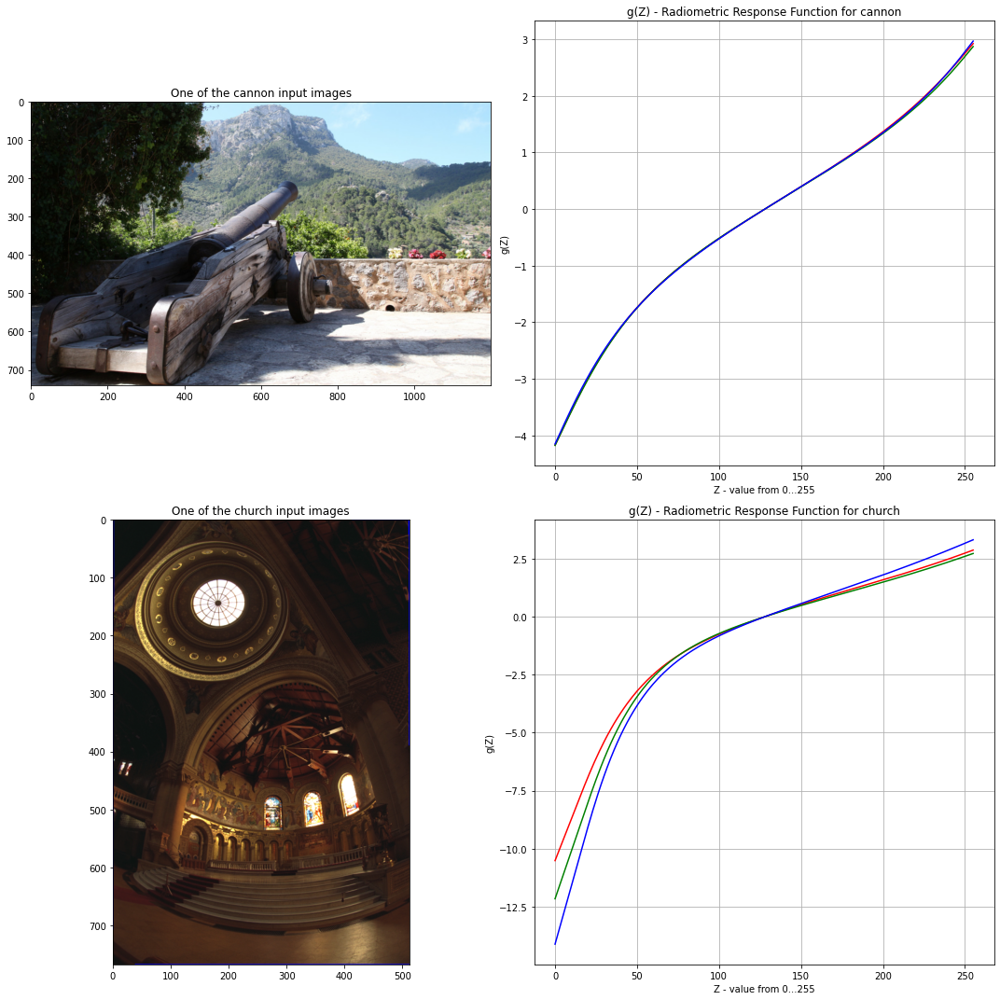

In [5]:
cannon_gs = np.array([debevec(cannon_imgs[:,:,:,channel], pick_pixels(cannon_imgs), cannon_speeds)[0] for channel in range(3)])
memorial_gs = np.array([debevec(memorial_imgs[:,:,:,channel], pick_pixels(memorial_imgs), memorial_speeds)[0] for channel in range(3)])

domain = range(0, 256)
color_map = ['red', 'green', 'blue']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

axes[0,0].imshow(cannon_imgs[1])
axes[0,0].set_title("One of the cannon input images")

axes[0,1].set_title("g(Z) - Radiometric Response Function for cannon")
axes[0,1].set_xlabel("Z - value from 0...255")
axes[0,1].set_ylabel("g(Z)")
axes[0,1].grid()
for i in range(3):
    axes[0,1].plot(domain, cannon_gs[i][domain], color=color_map[i])

axes[1,0].imshow(memorial_imgs[5])
axes[1,0].set_title("One of the church input images")

axes[1,1].set_title("g(Z) - Radiometric Response Function for church")
axes[1,1].set_xlabel("Z - value from 0...255")
axes[1,1].set_ylabel("g(Z)")
axes[1,1].grid()
for i in range(3):
    axes[1,1].plot(domain, memorial_gs[i][domain], color=color_map[i])

fig.tight_layout()
plt.plot()

## Radiance Map

After estimating the radiometric response function, we can generate the radiance map. The radiance map is our estimate of the true radiance value at each pixel. Once we know the true radiance values, we simply have to scale them so that they fill up the 0...255 range for the final output image.

The approach used is Debevec-Malik's (from the same paper as the radiometric response function estimation), where we take the fact that

$$ g(Z_{ij}) = \ln E_i  + \ln \Delta t_j$$

which implies that 

$$ \ln E_i = g(Z_{ij}) - \ln \Delta t_j$$

In order to estimate the radiance values, we take the results of this equation for each of the input images. Since we know that pixels with values close to 0 or 255 are likely noisy (since they are at the edge of what the camera can handle), we increase the weights for pixels with intensities closer to the middle of the range. Debevec-Malik's method uses:

$$
w(z) = 
\begin{cases} 
   z - Z_{min}, z \leq 0.5(Z_{min} + Z_{max})\\
   Z_{max} - z, z > 0.5(Z_{min} + Z_{max})
\end{cases}
$$

**Note:** This weighting function has a clear flaw - it returns zero for pixels with an intensity of 255 or 0, so if a pixel has this value across all images, we get a result of $\frac{0}{0}$ in the following equation. To account for this, my code adds 15 to the result of this w. This issue is discussed further in a later section, where I present an alternative weighting function with improved robustness over Debevec-Malik's.

The estimate for the log radiance then becomes the following weighted average, as described by Debevec-Malik:

$$
\ln E_i = \frac{\sum_{j=1}^P w(Z_{ij})(g(Z_{ij}) - \ln \Delta t_j)}{\sum_{j=1}^P w(Z_{ij})}
$$

The radiance map is then the exponential of the result of this computation. Note that we apply this operation to each channel separately, as with the radiometric response function estimation.

In [6]:
def radiance_map(imgs, shutter_speeds):
    """
    Outputs the radiance map made up of the input images.

    Parameters
    ----------
    imgs : array of multi-channel (RGB) images
    shutter_speeds : array of known log exposure times for each image
    """
    
    img_count, height, width, channels = imgs.shape

    pixels = pick_pixels(imgs)

    # Compute the response functions
    gs = []
    for channel in range(channels):
        g, _ = debevec(imgs[:,:,:,channel], pixels, shutter_speeds)
        gs.append(g)
    
    gs = np.array(gs)[:,:,0]

    # Create the radiance maps (for each channel)
    radiance_maps = np.zeros((3, height, width), dtype=np.float64)
    denoms = np.zeros((3, height, width), dtype=np.float64)
    for k in range(img_count):
        z = np.moveaxis(imgs[k, :, :, :], 2, 0)
        for channel in range(channels):
            z_c = z[channel]
            radiance_maps[channel] += w(z_c) * (gs[channel][z_c] - shutter_speeds[k])
            denoms[channel] += w(z_c)
    
    return np.exp(radiance_maps/denoms)

**Sample Radiance Maps**

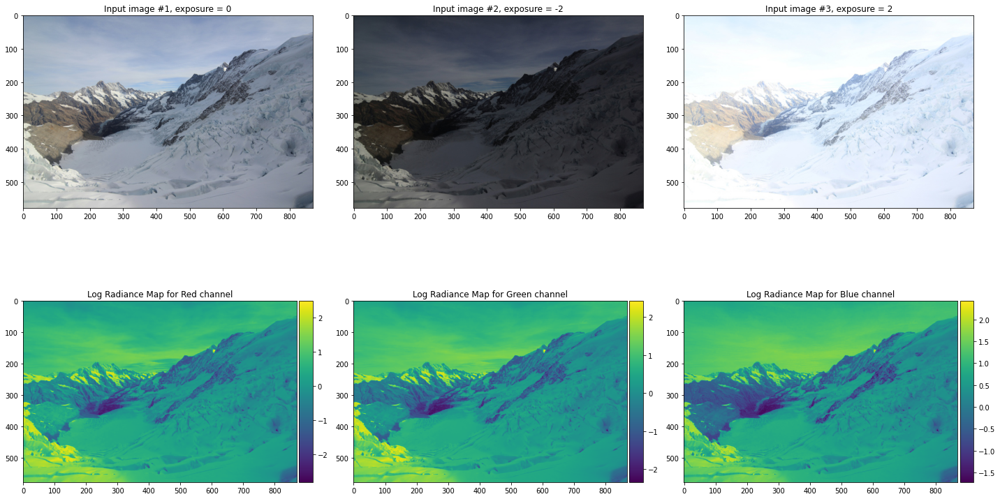

In [7]:
mountains_radiance_maps = radiance_map(mountains_imgs, mountains_speeds)
color_map = ['Red', 'Green', 'Blue']

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,12))
for i in range(3):
    axes[0,i].imshow(mountains_imgs[i])
    axes[0,i].set_title(f"Input image #{i+1}, exposure = {mountains_speeds[i]}")

    rad_im = axes[1,i].imshow(np.log(mountains_radiance_maps[i]))
    axes[1,i].set_title(f"Log Radiance Map for {color_map[i]} channel")

    divider = make_axes_locatable(axes[1,i])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(rad_im, cax=cax, orientation='vertical')

fig.tight_layout()
plt.show()

## Tone Map

After we have calculated the radiance maps for each channel, we now want to combine the results into an RGB image, with pixel intensities from 0 to 255. As described in the Szeliski text, there are two types of methods: global, and local. Global methods apply functions such as a gamma curve to the channel intensities in order to revert them to a displayable gamut. However, they struggle with images that have a wide-range of intensities (Szeliski).

For this reason, I chose to use a local method. Local methods more closely imitate the photographic techniques of dodging and burning, and produce better results (Szeliski). What these methods do is compare each pixel to the region around them rather than the whole image when processing the radiance maps. We end up essentially dividing each pixel by the average brightness in a region around the pixel (Szeliski). As shown in Durand's paper from 2002, using a bilateral filter for this local averaging provides better results than linear filters, as linear filters can cause a halo effect. I implemented an algorithm from Brown University's website which is a simplified version of Durand's algorithm for tone mapping, and it provided very good results. https://cs.brown.edu/courses/csci1290/asgn/proj2_hdr/index.html#:~:text=for%20all%20pixels.-,Tone%20mapping,-Recovering%20the%20radiance

Szeliski's paper describes more recent advancements in tone mapping. These new methods provide better resulting images, but they are more computationally expensive. This is an area that would be a reasonable next step for further exploration. 

In [8]:
def tone_map(radiance_maps, base_scaler=4, saturation_mult=1.3, gamma_val=1.6):
    """
    Given the radiance map for each channel, produces a tone mapped image.
    Follows a variation of Durand's method, as described in 
    https://cs.brown.edu/courses/csci1290/asgn/proj2_hdr/index.html.

    Parameters
    ----------
    radiance_maps : the output of radiance_map() 
    base_scaler : the scaling factor for the base layer
    saturation_mult : the saturation multiplier for the chrominance channels
    gamma_val : the gamma parameter for gamma correction
    """

    I = (radiance_maps[0] + radiance_maps[1] + radiance_maps[2]) / 3

    chrom_chans = np.power(radiance_maps/I, saturation_mult)

    log_intensities = np.log(I)
    base = np.array(cv2.bilateralFilter(log_intensities.astype(np.float32), 7, 75, 75), dtype=np.float64)

    detail = log_intensities - base
    scaled_base = (base-np.max(base))*(base_scaler/(np.max(base)-np.min(base)))
    new_intensity = np.exp(scaled_base + detail)

    new_colours = new_intensity * chrom_chans
    
    gamma_corrected = np.power(new_colours, 1/gamma_val)

    result = np.clip(np.moveaxis(gamma_corrected, 0, 2), 0, 1)
    return result

## Combined Algorithm

By putting together all the steps, we can generate HDR images!

In [9]:
def hdr(imgs, shutter_speeds, base_scaler=4, saturation_mult=1.3, gamma_val=1.6):
    """
    Outputs the HDR image made up of the input images.

    Parameters
    ----------
    imgs : array of multi-channel (RGB) images
    shutter_speeds : array of known log exposure times for each image
    base_scaler : the scaling factor for the base layer (used for tone map)
    saturation_mult : the saturation multiplier for the chrominance channels (used for tone map)
    gamma_val : the gamma parameter for gamma correction (used for tone map)
    """
    
    radiance_maps = radiance_map(imgs, shutter_speeds)
    return tone_map(radiance_maps, base_scaler, saturation_mult, gamma_val)
    

## Results

As we can see, the resulting images all have great detail in both the dark regions, as well as the bright regions. The runtime is also very good for this algorithm, taking roughly 2 seconds per image on my i5-8520U 1.60GHz cpu. The runtime could be improved by sampling fewer points for Debevec-Malik's algorithm, or by using a global tone mapping algorithm which is less computationally expensive.

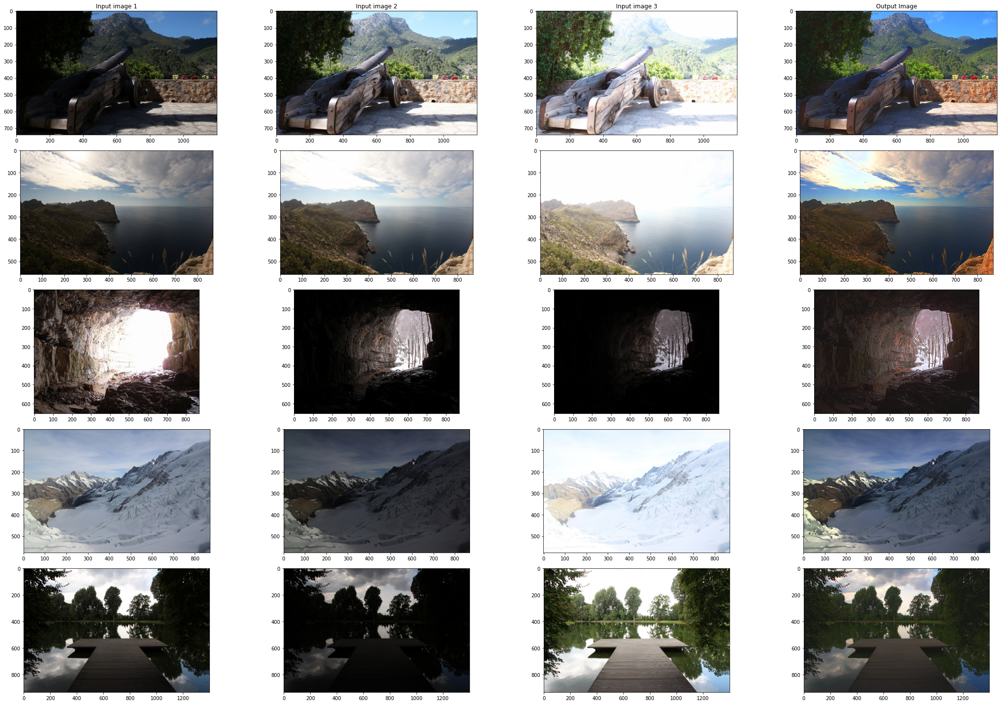

In [10]:
used_datapoints = [0, 1, 2, 4, 5]

fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(30, 20))

axes[0,0].set_title("Input image 1")
axes[0,1].set_title("Input image 2")
axes[0,2].set_title("Input image 3")
axes[0,3].set_title("Output Image")

for index, datapoint in enumerate(used_datapoints):
    hdr_image = hdr(all_imgs[datapoint], all_speeds[datapoint])
    for i in range(3):
        axes[index,i].imshow(all_imgs[datapoint][i])
    axes[index,3].imshow(hdr_image)

fig.tight_layout()
plt.show()

**Debevec Church Image**

This sequence has 11 images, compared to 3. The bottom right is the hdr result.


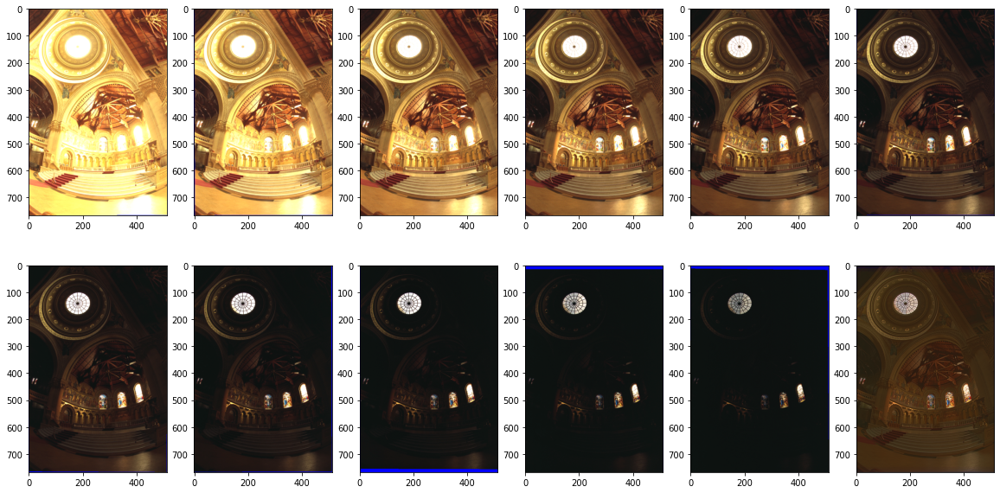

In [11]:
plt.figure(figsize=(20,10))
for i in range(11):
    plt.subplot(2, 6, i+1)
    plt.imshow(memorial_imgs[i])
plt.subplot(2, 6, 12)
plt.imshow(hdr(memorial_imgs, memorial_speeds, base_scaler=6, saturation_mult=1, gamma_val=2.7))
plt.show()

**Testing with my own photos**

I took these photos in my apartment using my phone and no tripod. As you can see, the algorithm gives very good results, even with the slight movements and inaccuracies that come from not using a tripod.

In [12]:
lester_imgs = np.array([(plt.imread(f"images\lester\lester{num}.jpg"))for num in range(1, 4)], dtype=np.int32)
lester_speeds = np.array([2, 0, -2])

bath_imgs = np.array([(plt.imread(f"images\\bath\\bath{num}.jpg"))for num in range(1, 4)], dtype=np.int32)
bath_speeds = np.array([2, 0, -2])

new_bath_imgs = np.array([(plt.imread(f"images\\new_bath\\new_bath{num}.jpg"))for num in range(1, 4)], dtype=np.int32)
new_bath_speeds = np.array([-2, 0, 2])


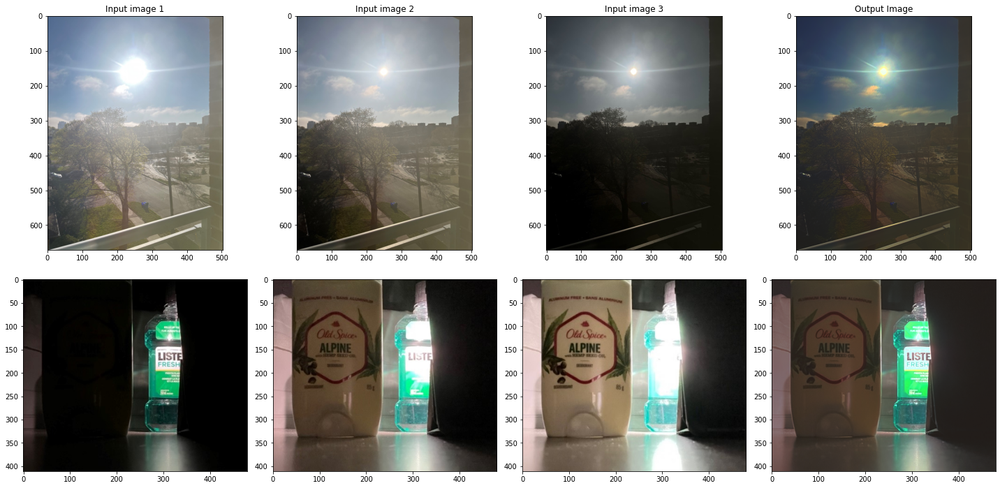

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20,10))
axes[0,0].set_title("Input image 1")
axes[0,1].set_title("Input image 2")
axes[0,2].set_title("Input image 3")
axes[0,3].set_title("Output Image")

for i in range(3):
    axes[0,i].imshow(lester_imgs[i])
    axes[1,i].imshow(new_bath_imgs[i])
axes[0,3].imshow(hdr(lester_imgs, lester_speeds, saturation_mult=1.2, base_scaler=6, gamma_val=2.8))
axes[1,3].imshow(hdr(new_bath_imgs, new_bath_speeds, saturation_mult=1.2, base_scaler=6, gamma_val=2.8))

fig.tight_layout()
plt.show()

## Discovered Issue in Debevec-Malik Method

While experimenting with the various algorithms, I came across an issue with the Debevec-Malik method for generating radiance maps. The issue relates to the method for calculating the final radiance values, and w(Z).

Let's say we have 3 images, with exposures -2, 0, and 2, and suppose our g function is roughly equal to g(Z) = -4 + 8*(Z/255) - this is very close to the empirical results, but the g function itself isn't too important.

 Consider a pixel with intensity = 255 for all images. Then we see that when we calculate the log radiance using Equation 6 from Debevec-Malik we will get 0/0. Ok - how to fix this? If we add a small number epsilon to the denominator, we will still get ln Ei = 0, which isn't good considering this point should have maximum radiance. What if we instead change the w(Z) function to add 1 (equivalent to changing the Z_max to 256, Z_min to -1)? This lets us keep Equation 6 as is, and seems very reasonable for w, as it has the exact same shape - we could even add a tiny epsilon to w, rather than 1. However, now that we are past the 0/0 issue, we see another big problem. To illustrate this, we will compare our original pixel to a pixel which has intensity 254 for the low-exposure image, and 255 for the others.

In [14]:
def sample_g(Z):
    return -4 + 8*(Z/255)

def sample_w(Z):
    return 1 + np.where(Z <= (z_min + z_max)/2, Z-z_min, z_max-Z)

radiance_1 = sample_w(255)*(sample_g(255) - (-2)) + sample_w(255)*(sample_g(255) - (0)) + sample_w(255)*(sample_g(255) - (2))
radiance_1 /= (sample_w(255) + sample_w(255) + sample_w(255))

radiance_2 = sample_w(254)*(sample_g(254) - (-2)) + sample_w(255)*(sample_g(255) - (0)) + sample_w(255)*(sample_g(255) - (2))
radiance_2 /= (sample_w(254) + sample_w(255) + sample_w(255))

print("Radiance 1:", np.exp(radiance_1), ", Radiance 2:", np.exp(radiance_2))

Radiance 1: 54.598150033144236 , Radiance 2: 88.61611495944598


As we can see, pixel 2, which is identical to pixel 1 except for a 1 pixel decrease, somehow has a higher intensity. How?

The reason is that for pixel 2, the image with exposure (-2) will have double the weight as compared to the other images because of how w(Z) is defined.
However, g is not changing very quickly at 255. This means that while the log radiance of pixel 1 is just $\frac{(4-(-2)) + (4-0) + (4-2)}{3}=4$, pixel 2's log radiance is more heavily weighted towards $g(254) - (-2) \approx 6$, which gives it a larger value.

The code below shows the result of this on an image:

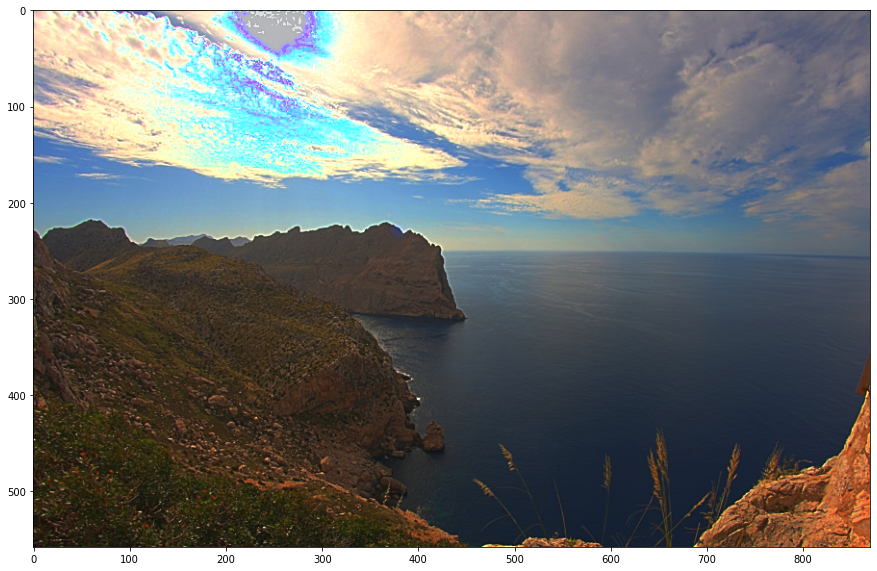

In [15]:
def w(z):
    """
    Slightly modified definition of w(z), adding 1 to all results.
    Closest to original definition that doesn't give a NaN.

    Parameters
    ----------
    z : integer intensity, z_min <= z <= z_max
    """
    return 1 + np.where(z <= (z_min + z_max)/2, z-z_min, z_max-z)

plt.figure(figsize=(15,15))
plt.imshow(hdr(cap_imgs, cap_speeds))
plt.show()

How can we fix this? 

As we can see, the problem boils down to the fact that at extreme values, when we change intensity by 1, our weights change drastically. This leads to pixels that have consistently extreme values across all images getting estimated intensities with large variances, and when a low-exposure image has a slightly lower intensity (but still very high), this will lead to these pixels getting a higher intensity than those with 255 intensity for all images.

One solution, which I used for all the previous results, is to instead add 15 to the original w(Z). This makes it so w(255)=15, w(254)=16, and since there is hardly a difference, we no longer get such intense artifacts. However, we can potentially do better. 

My suggested solution is to use a weighting function w(Z) that tapers off towards the ends, so that the relative value of $\frac{w(Z-1)}{w(Z)}$ is fairly consistent across all points.

The following function, which is close to a Gaussian, seems to work well. The reason for choosing this function is that the exponential function has a constant value of $\frac{exp(Z-1)}{exp(Z)}$, so combining two exponential functions that are facing opposite directions will roughly maintain this property. The rest was just ensuring the scaling is consistent with the original w function. Results with this w(Z) are below. Looking at the bright spots, we see there are no issues.

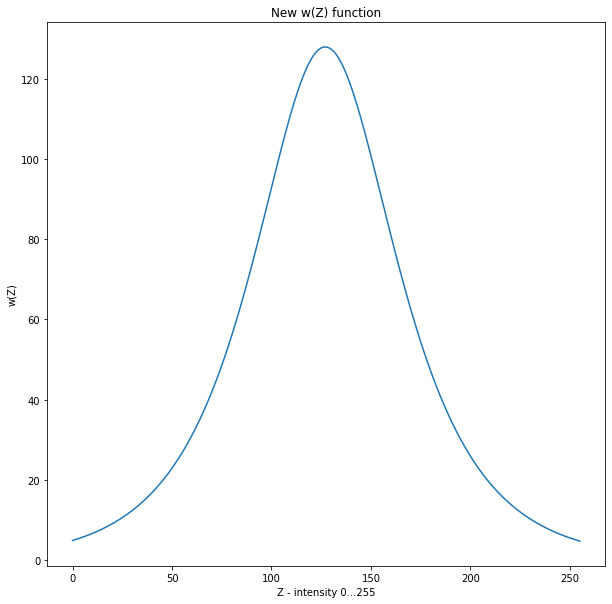

In [16]:
def w(z):
    """
    A more robust version of w(z).

    Parameters
    ----------
    z : integer intensity, z_min <= z <= z_max
    """
    width_scale = 1/(2*np.sqrt(n))
    return n/(np.exp(width_scale*(z-127)) + np.exp(-width_scale*(z-127)))

plt.figure(figsize=(10,10))
plt.title("New w(Z) function")
plt.xlabel("Z - intensity 0...255")
plt.ylabel("w(Z)")
domain = np.arange(0, 256, dtype=np.int32)
plt.plot(domain, w(domain))
plt.show()

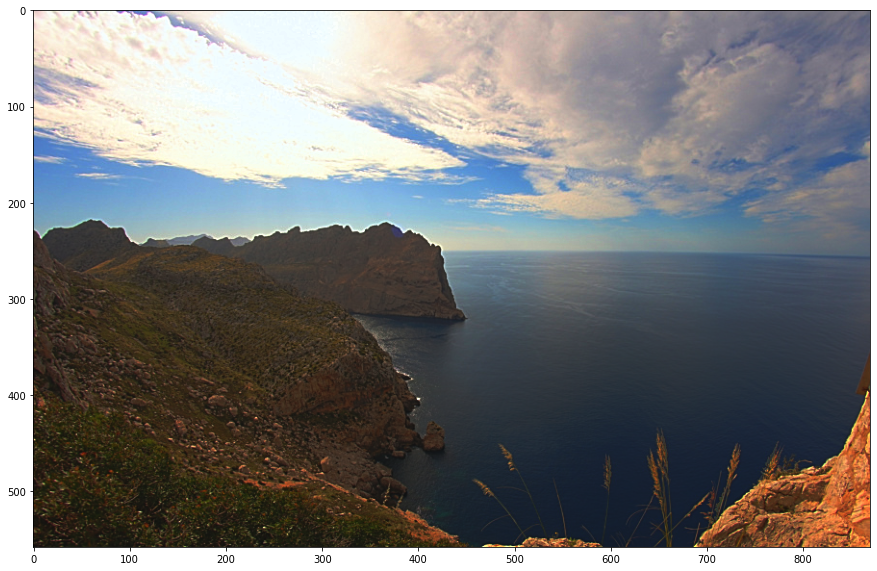

In [17]:
plt.figure(figsize=(15,15))
plt.imshow(hdr(cap_imgs, cap_speeds))
plt.show()

## Results Using New w(Z) Function

Overall, the results are very similar to the original w function, but we see that the extreme regions no longer have glitchy areas. The previous results used the original w, except we added 15. If you look closely at the second sequence of images in the original results (the island), the visual bugs still exist in the sunny area, but the added constant of 15 makes it much less noticeable than with the original w function. However, this new w function completely eliminates the issue.

Below, we show the results of my w(Z) function on the sample images.

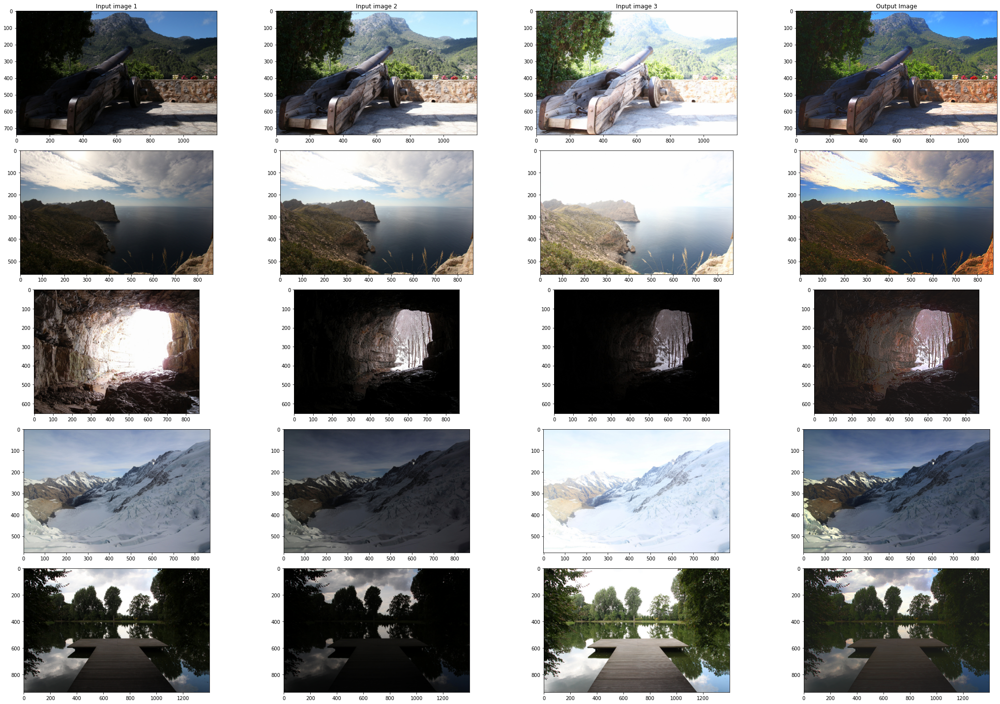

In [18]:
used_datapoints = [0, 1, 2, 4, 5]

fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(30, 20))

axes[0,0].set_title("Input image 1")
axes[0,1].set_title("Input image 2")
axes[0,2].set_title("Input image 3")
axes[0,3].set_title("Output Image")

for index, datapoint in enumerate(used_datapoints):
    hdr_image = hdr(all_imgs[datapoint], all_speeds[datapoint])
    for i in range(3):
        axes[index,i].imshow(all_imgs[datapoint][i])
    axes[index,3].imshow(hdr_image)

fig.tight_layout()
plt.show()

## Conclusions

For generating the radiance maps, Debevec-Malik's method provides very good results in general. However, it does struggle with extreme regions as I noticed, since the relative change in weights is too extreme while there are no major changes in the g function. However, this can be fixed with an improved weighting function that is smoother and tapers off towards the extremities. 

The local tone mapping method used provides good results, with customizable parameters which allow for easy adjustments. There have since been improved methods as described by Szeliski, however, these come at a greater computational cost. Global tone mapping was not used in this paper, as it has been shown to provide noticeably worse results.

As can be seen from the sample images, this method provides very good results, as we are able to see great details in all regions in the resulting images. This paper has also shown that it is quite simple to apply this technique yourself, as I was able to generate impressive results with just my cellphone's camera and without a tripod.

## References

Richard Szeliski, Computer Vision: Algorithms and Applications 2nd Edition, 2021

Paul E. Debevec and Jitendra Malik, Recovering High Dynamic Range Radiance Maps from Photographs, 1997, https://www.pauldebevec.com/Research/HDR/debevec-siggraph97.pdf

Durand, Fast Bilateral Filtering for the Display of High-Dynamic-Range Images, 2002, http://people.csail.mit.edu/fredo/PUBLI/Siggraph2002/DurandBilateral.pdf

Brown University, Simplified Tone Mapping Algorithm, https://cs.brown.edu/courses/csci1290/asgn/proj2_hdr/index.html


## Image Sources

EasyHDR Sample Pictures, https://www.easyhdr.com/examples/

Memorial Church, Paul E. Debevec, https://www.pauldebevec.com/Research/HDR/
